<a href="https://colab.research.google.com/github/Thabet-Chaaouri/Diffusers/blob/main/Sampling_photos_of_Thabet_from_finetuned_SD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install diffusers==0.8.0 transformers scipy ftfy accelerate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!huggingface-cli login


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To login, `huggingface_hub` now requires a token generated from https://huggingface.co/settings/tokens .
    
Token: 
Add token as git credential? (Y/n) n
Token is valid.
Your token has been saved to /root/.huggingface/token
Login successful


In [3]:
from diffusers import StableDiffusionPipeline #text to image
import transformers
import torch
from torch import autocast

model_id = "Thabet/sd-finetuned-on-thabetchaaouri"
device = "cuda"

pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16, use_auth_token=True)
pipe = pipe.to(device)


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

The config attributes {'requires_safety_checker': True} were passed to StableDiffusionPipeline, but are not expected and will be ignored. Please verify your model_index.json configuration file.
Keyword arguments {'requires_safety_checker': True} not recognized.
The config attributes {'prediction_type': 'epsilon'} were passed to PNDMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.
The config attributes {'class_embed_type': None, 'mid_block_type': 'UNetMidBlock2DCrossAttn', 'num_class_embeds': None, 'only_cross_attention': False, 'resnet_time_scale_shift': 'default', 'upcast_attention': False, 'use_linear_projection': False} were passed to UNet2DConditionModel, but are not expected and will be ignored. Please verify your config.json configuration file.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. En

In [6]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [4]:
generator = torch.Generator("cuda").manual_seed(1026)

prompt = ["A photograph of ThabetChaaouri as a Batman"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=7.5, generator=generator)

  0%|          | 0/51 [00:00<?, ?it/s]

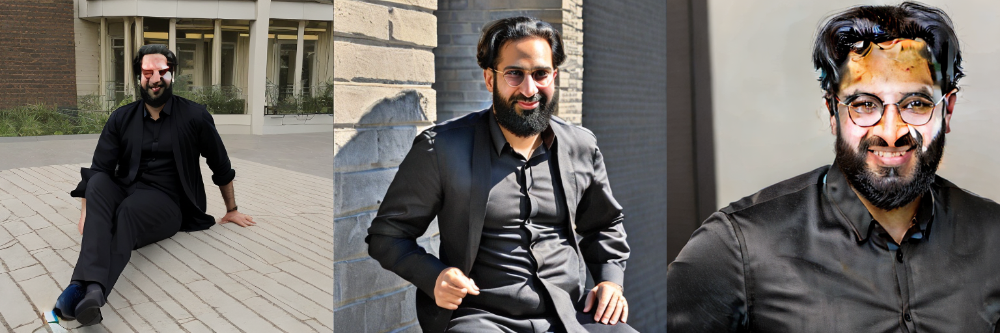

In [7]:
grid = image_grid(images.images, rows=1, cols=3)
grid

  0%|          | 0/51 [00:00<?, ?it/s]

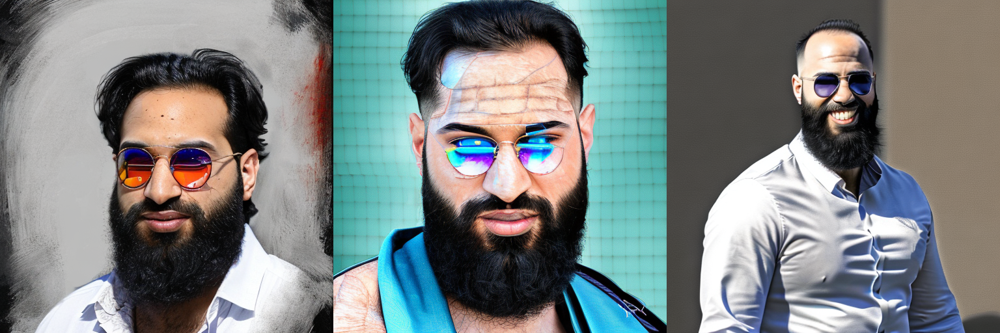

In [8]:
generator = torch.Generator("cuda").manual_seed(126)

prompt = ["A digital paiting of Kratos, Greg Rutkowsi, ThabetCHAAOURI"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=7.5, generator=generator)

grid = image_grid(images.images, rows=1, cols=3)
grid

  0%|          | 0/51 [00:00<?, ?it/s]

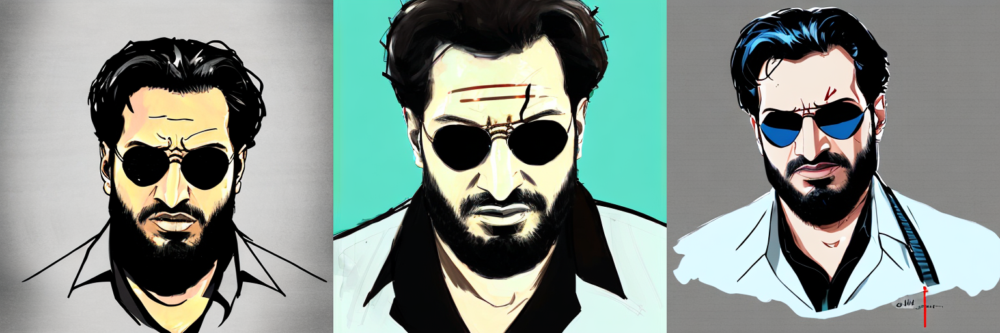

In [10]:
generator = torch.Generator("cuda").manual_seed(126)

prompt = ["A digital paiting of ThabetChaaouri as Big Boss from metal Gear Solid, Yoji shinkawa"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=7.5, generator=generator)

grid = image_grid(images.images, rows=1, cols=3)
grid

  0%|          | 0/51 [00:00<?, ?it/s]

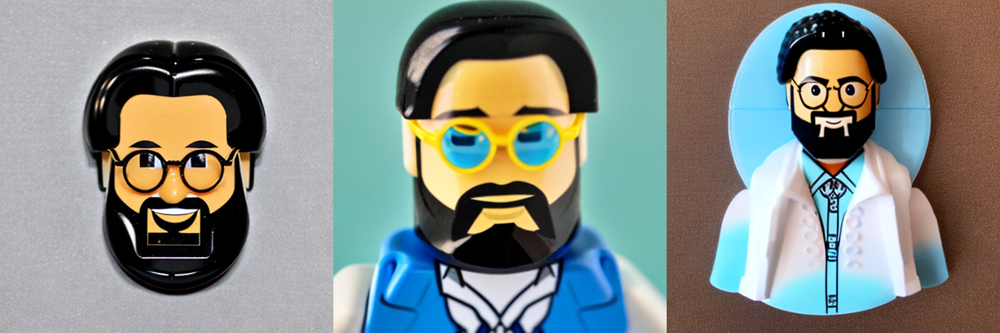

In [15]:
generator = torch.Generator("cuda").manual_seed(126)

prompt = ["A 3D lego minifigure with the face of ThabetChaaouri"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=7.5, generator=generator)

grid = image_grid(images.images, rows=1, cols=3)
grid

  0%|          | 0/51 [00:00<?, ?it/s]

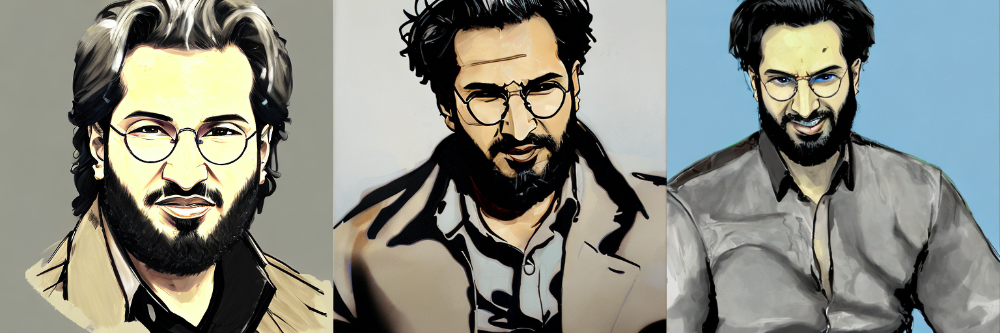

In [21]:
generator = torch.Generator("cuda").manual_seed(8)

prompt = ["A digital paiting of ThabetChaaouri as Liquid Snake, Yoji shinkawa"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=6.5, generator=generator)

grid = image_grid(images.images, rows=1, cols=3)
grid

  0%|          | 0/51 [00:00<?, ?it/s]

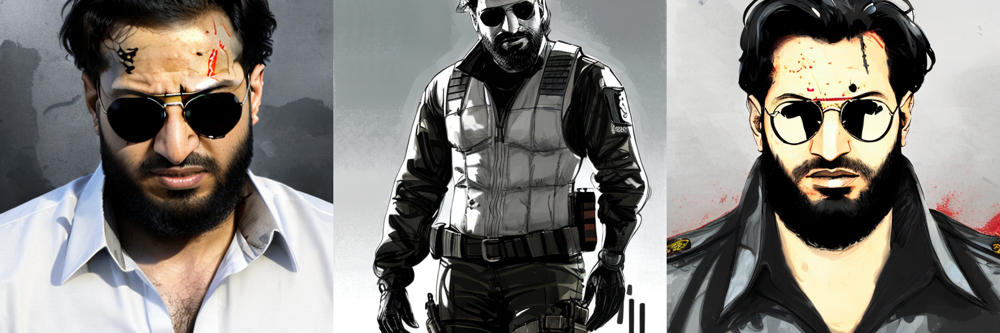

In [22]:
generator = torch.Generator("cuda").manual_seed(6548)

prompt = ["A digital paiting of ThabetChaaouri as Venom Snake's Metal Gear, Yoji shinkawa"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=7.5, generator=generator)

grid = image_grid(images.images, rows=1, cols=3)
grid

In [25]:
images.images[2].save("ThabetChaaouri as Venom Snake's Metal Gear.png")

  0%|          | 0/51 [00:00<?, ?it/s]

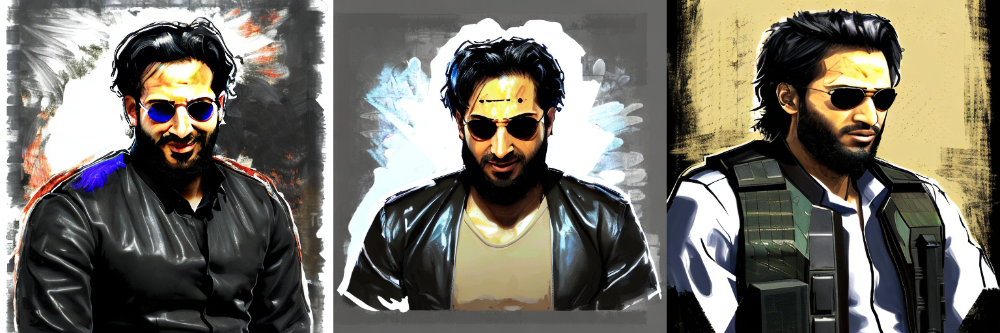

In [32]:
generator = torch.Generator("cuda").manual_seed(5648913)

prompt = ["A digital paiting of ThabetChaaouri as Raiden's Metal Gear, Yoji shinkawa"]*3
with autocast("cuda"):
    images = pipe(prompt, guidance_scale=7.5, generator=generator)

grid = image_grid(images.images, rows=1, cols=3)
grid

In [33]:
images.images[2].save("ThabetChaaouri as Raiden's Metal Gear.png")